# Подготовка данных о температуре и влажности почвы территории США на разных глубинах для статистического анализа

In [9]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

### Привдение данных из текстового файла к стандартным разделителям (пробел)

In [65]:
def separator_rewriting(input_data, output_folder):
    for data_folder in os.listdir(input_data):
        for file in os.listdir(os.path.join(input_data,data_folder)):
            with open (os.path.join(input_data, data_folder, file)) as old_file:
                l_list=old_file.readlines()
                for line in l_list:
                    while '  ' in line:
                        line=line.replace('  ', ' ')
                    with open (os.path.join(output_folder, file.split('-')[-1]), 'a') as new_file:
                        new_file.write(line)

In [66]:
inp='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/input_data'
out='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/parsed_2018-2020'
separator_rewriting(inp,out)

### Отсеивание станций, с большим количеством пропусков

In [70]:
def get_gaps_stations(data_folder, items_dict_list, threshold=0.05):
    invalid_stations=[]
    for file in os.listdir(data_folder):
        df=pd.read_csv(os.path.join(data_folder, file), sep=' ', header=None)
        for item in items_dict_list:
            dataset=df[item['id']]
            (unique, counts) = np.unique(dataset, return_counts=True)
            unique_values=dict(zip(unique, counts))    
            if item['nodata'] in unique_values.keys() and unique_values[item['nodata']]>len(dataset)*threshold:
                if file not in invalid_stations:
                    invalid_stations.append(file)
    print('All stations:')
    print(len(os.listdir(data_folder)))
    print('Invalid stations:')
    print(len(invalid_stations))    
    return invalid_stations

In [542]:
temp_daily=[{'id':14, 'name':'SUR_TEMP_DAILY_AVG', 'nodata':-9999}, 
     {'id':23, 'name':'SOIL_TEMP_5_DAILY', 'nodata':-9999}, 
     {'id':24, 'name':'SOIL_TEMP_10_DAILY', 'nodata':-9999}, 
     {'id':26, 'name':'SOIL_TEMP_20_DAILY', 'nodata':-9999}, 
     {'id':26, 'name':'SOIL_TEMP_50_DAILY', 'nodata':-9999}, 
     {'id':27, 'name':'SOIL_TEMP_100_DAILY', 'nodata':-9999}]

incorrect=get_gaps_stations(out, temp_daily, threshold=0.01)
print(incorrect)

All stations:
157
Invalid stations:
110
['AK_Aleknagik_1_NNE.txt', 'AK_Bethel_87_WNW.txt', 'AK_Cordova_14_ESE.txt', 'AK_Deadhorse_3_S.txt', 'AK_Denali_27_N.txt', 'AK_Fairbanks_11_NE.txt', 'AK_Glennallen_64_N.txt', 'AK_Gustavus_2_NE.txt', 'AK_Ivotuk_1_NNE.txt', 'AK_King_Salmon_42_SE.txt', 'AK_Metlakatla_6_S.txt', 'AK_Port_Alsworth_1_SW.txt', 'AK_Red_Dog_Mine_3_SSW.txt', 'AK_Ruby_44_ESE.txt', 'AK_Sand_Point_1_ENE.txt', 'AK_Selawik_28_E.txt', 'AK_Sitka_1_NE.txt', 'AK_St._Paul_4_NE.txt', 'AK_Tok_70_SE.txt', 'AK_Toolik_Lake_5_ENE.txt', 'AK_Yakutat_3_SSE.txt', 'AL_Brewton_3_NNE.txt', 'AL_Clanton_2_NE.txt', 'AL_Courtland_2_WSW.txt', 'AL_Cullman_3_ENE.txt', 'AL_Fairhope_3_NE.txt', 'AL_Gainesville_2_NE.txt', 'AL_Greensboro_2_WNW.txt', 'AL_Highland_Home_2_S.txt', 'AL_Muscle_Shoals_2_N.txt', 'AL_Northport_2_S.txt', 'AL_Russellville_4_SSE.txt', 'AL_Scottsboro_2_NE.txt', 'AL_Selma_13_WNW.txt', 'AL_Selma_6_SSE.txt', 'AL_Talladega_10_NNE.txt', 'AL_Thomasville_2_S.txt', 'AL_Troy_2_W.txt', 'AL_Valley_H

### Запись в файл корректных станций

In [82]:
def save_correct_stations(invalid_stations, valid_file, output_file):
    stations_df=pd.read_csv(valid_file, sep=';', header = None)
    for index, row in stations_df.iterrows():
        file_name=(row[2]+'_'+row[3]+'_'+row[4]+'.txt').replace(' ', '_')
        if file_name not in invalid_stations:
            with open (output_file, 'a') as file:
                file.write(str(row[0])+';'+str(row[1])+';'+str(row[2])+';'+str(row[3])+';'+str(row[4])+';'+str(row[5])+';'+str(row[6])+';'+str(row[7])+';'+str(row[8])+';'+str(row[9])+';'+str(row[10])+';'+str(row[11])+';'+str(row[12])+';'+str(row[13])+';'+str(row[14])+';'+str(row[15])+'\n')

In [543]:
save_correct_stations(incorrect, 'C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/valid_stations.csv', 'C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/valid_temperature_NO_gaps.csv')

### Вывод графиков для корректных станций

#### Для температуры

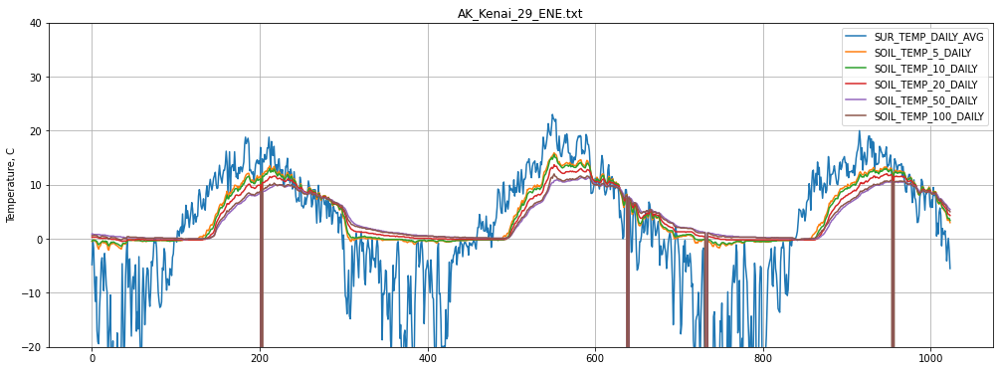

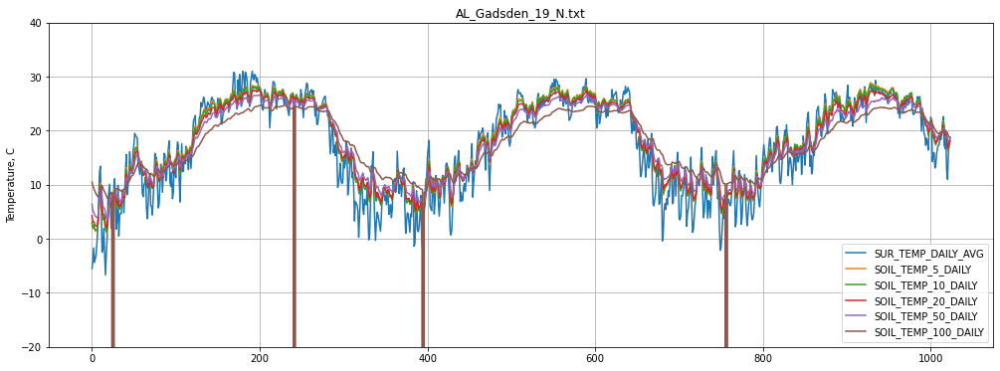

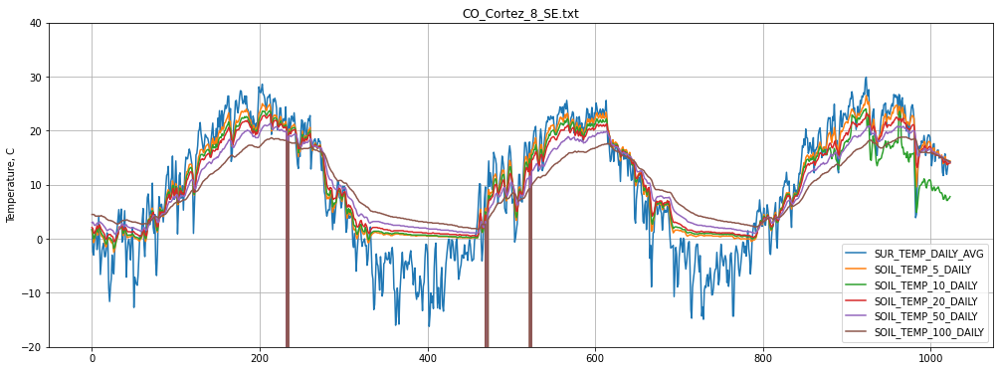

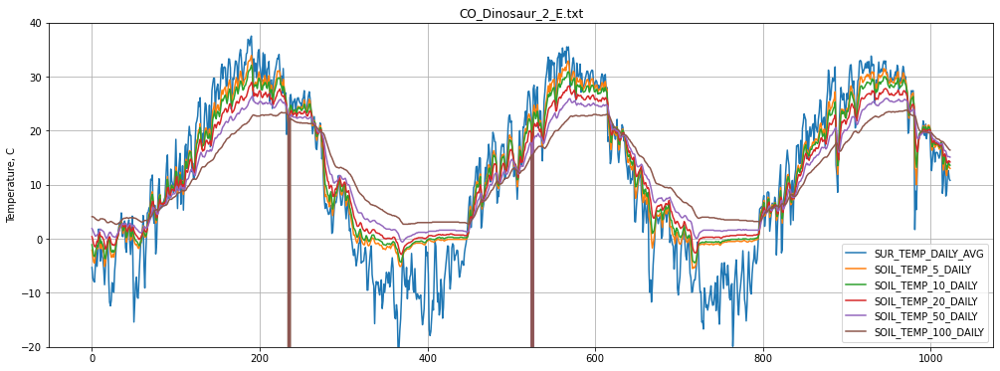

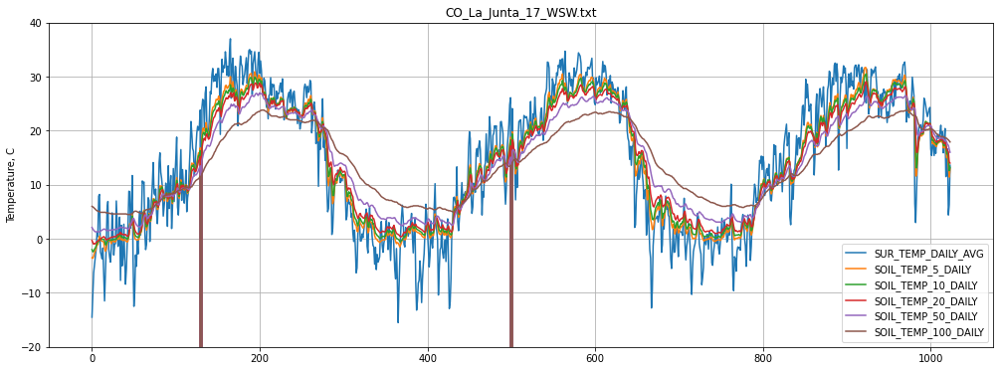

...

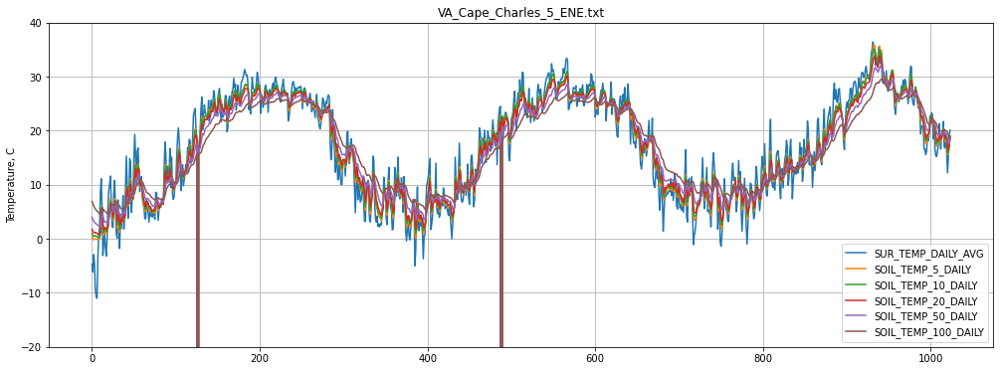

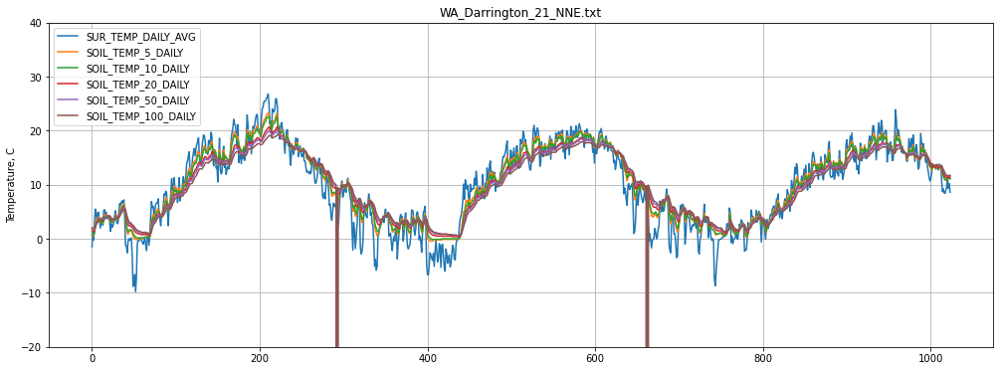

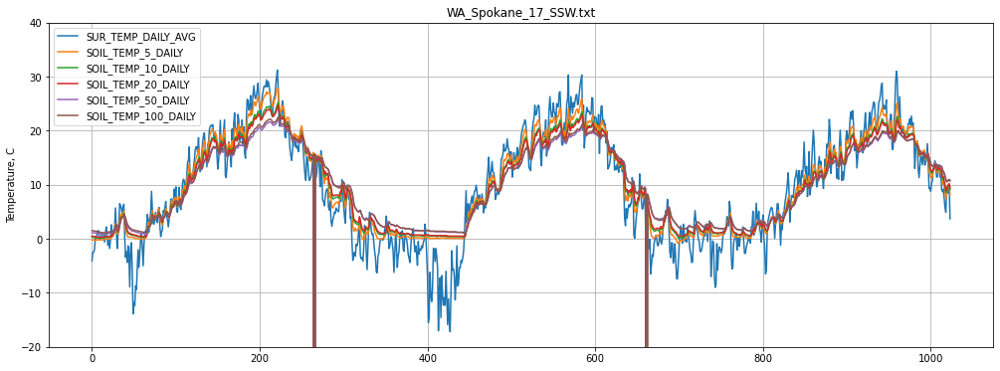

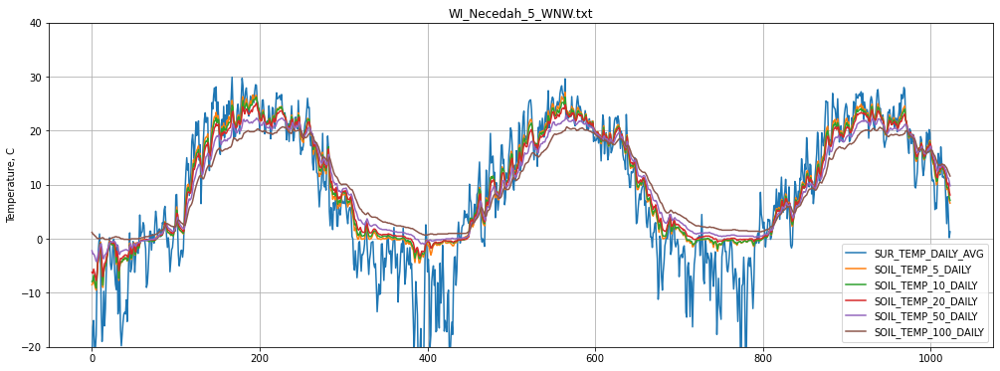

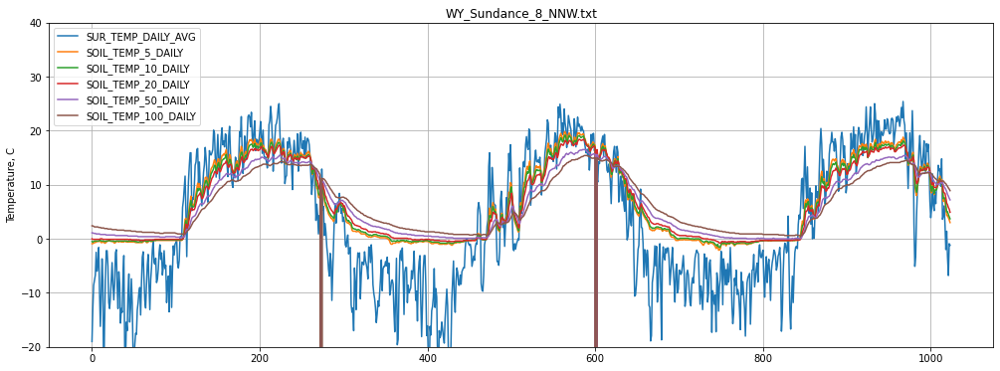

In [545]:
for file in os.listdir(out):    
    if file not in incorrect:    
        df=pd.read_csv(os.path.join(out, file), sep=' ', header=None)
        SUR_TEMP=df[14]
        SOIL_TEMP_5=df[23]
        SOIL_TEMP_10=df[24]
        SOIL_TEMP_20=df[25]
        SOIL_TEMP_50=df[26]
        SOIL_TEMP_100=df[27]
        numbers=np.arange(len(SUR_TEMP))
        plt.rcParams['figure.figsize'] = [17, 6]
        fig, ax = plt.subplots()
        ax.plot(numbers, SUR_TEMP, label='SUR_TEMP_DAILY_AVG')
        ax.plot(numbers, SOIL_TEMP_5, label='SOIL_TEMP_5_DAILY')
        ax.plot(numbers, SOIL_TEMP_10, label='SOIL_TEMP_10_DAILY')
        ax.plot(numbers, SOIL_TEMP_20, label='SOIL_TEMP_20_DAILY')
        ax.plot(numbers, SOIL_TEMP_50, label='SOIL_TEMP_50_DAILY')
        ax.plot(numbers, SOIL_TEMP_100, label='SOIL_TEMP_100_DAILY')
        ax.grid()
        ax.set(ylabel='Temperature, C',title=file)
        plt.ylim((-20,40))
        plt.legend()
        plt.show()

#### Для влажности почвы

All stations:
157
Invalid stations:
103
['AK_Aleknagik_1_NNE.txt', 'AK_Bethel_87_WNW.txt', 'AK_Cordova_14_ESE.txt', 'AK_Deadhorse_3_S.txt', 'AK_Denali_27_N.txt', 'AK_Fairbanks_11_NE.txt', 'AK_Glennallen_64_N.txt', 'AK_Gustavus_2_NE.txt', 'AK_Ivotuk_1_NNE.txt', 'AK_Kenai_29_ENE.txt', 'AK_King_Salmon_42_SE.txt', 'AK_Metlakatla_6_S.txt', 'AK_Port_Alsworth_1_SW.txt', 'AK_Red_Dog_Mine_3_SSW.txt', 'AK_Ruby_44_ESE.txt', 'AK_Sand_Point_1_ENE.txt', 'AK_Selawik_28_E.txt', 'AK_Sitka_1_NE.txt', 'AK_St._Paul_4_NE.txt', 'AK_Tok_70_SE.txt', 'AK_Toolik_Lake_5_ENE.txt', 'AK_Yakutat_3_SSE.txt', 'AL_Brewton_3_NNE.txt', 'AL_Clanton_2_NE.txt', 'AL_Courtland_2_WSW.txt', 'AL_Cullman_3_ENE.txt', 'AL_Gainesville_2_NE.txt', 'AL_Greensboro_2_WNW.txt', 'AL_Highland_Home_2_S.txt', 'AL_Muscle_Shoals_2_N.txt', 'AL_Northport_2_S.txt', 'AL_Russellville_4_SSE.txt', 'AL_Scottsboro_2_NE.txt', 'AL_Selma_6_SSE.txt', 'AL_Talladega_10_NNE.txt', 'AL_Thomasville_2_S.txt', 'AL_Troy_2_W.txt', 'AL_Valley_Head_1_SSW.txt', 'AZ_Elgi

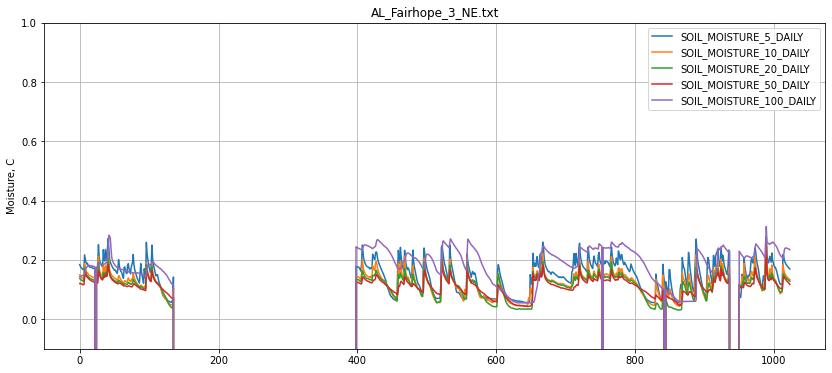

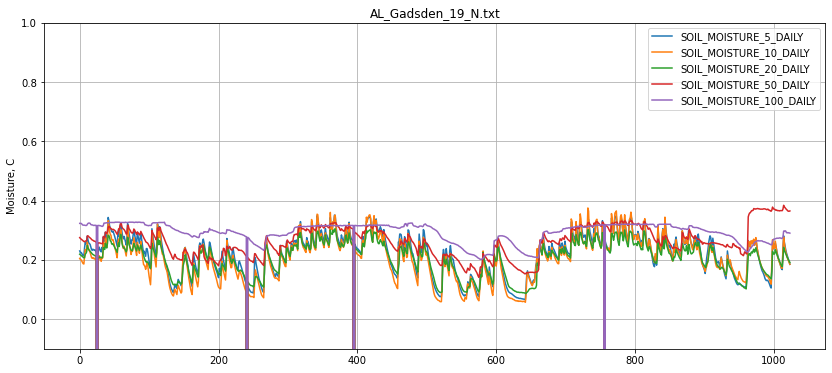

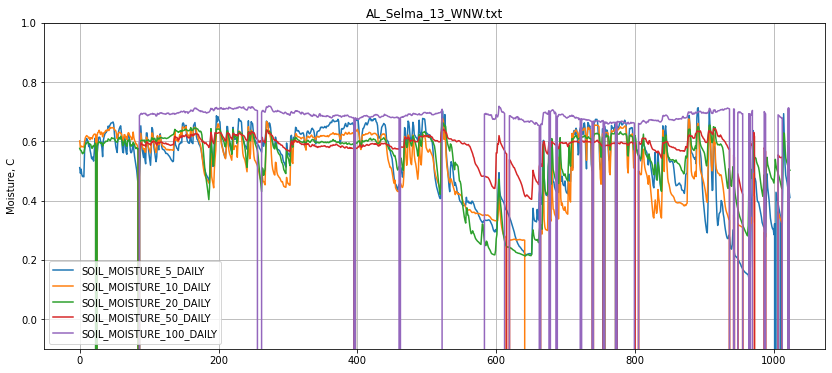

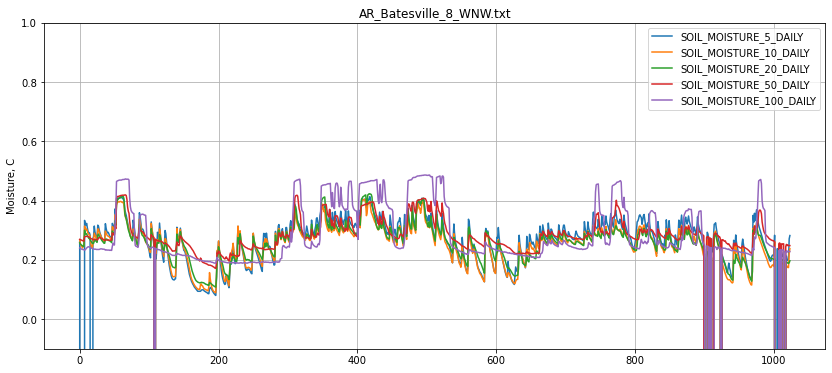

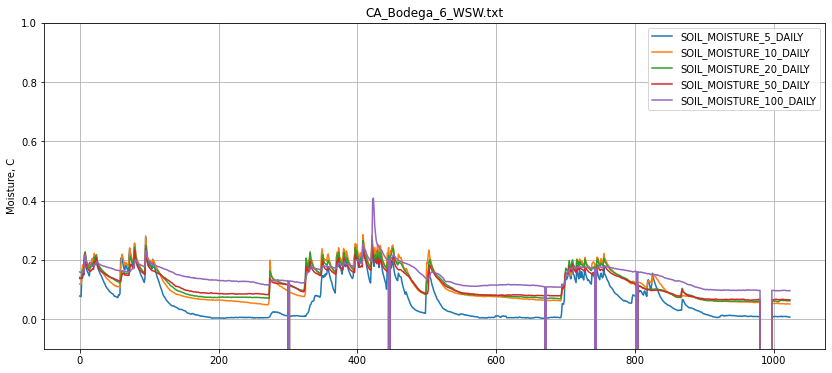

...

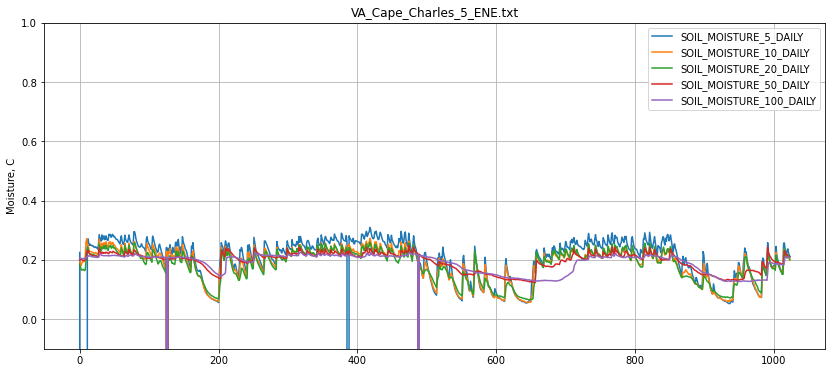

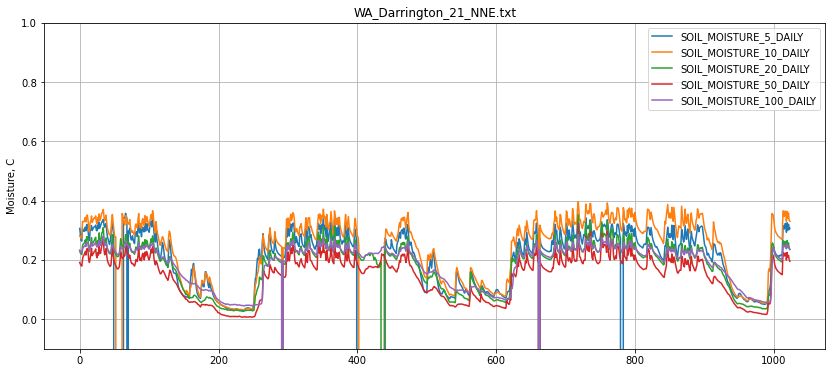

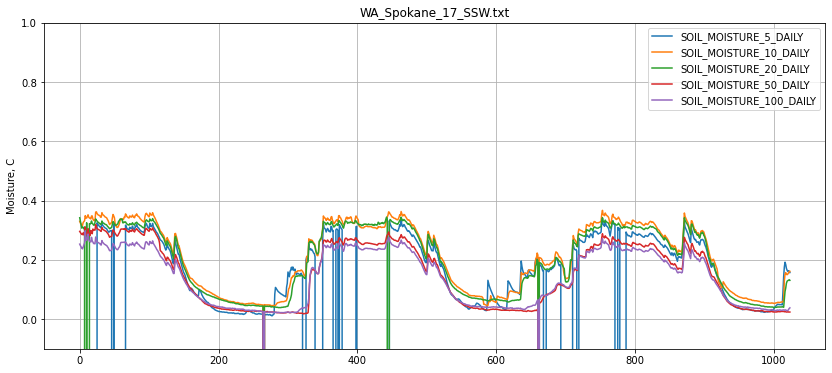

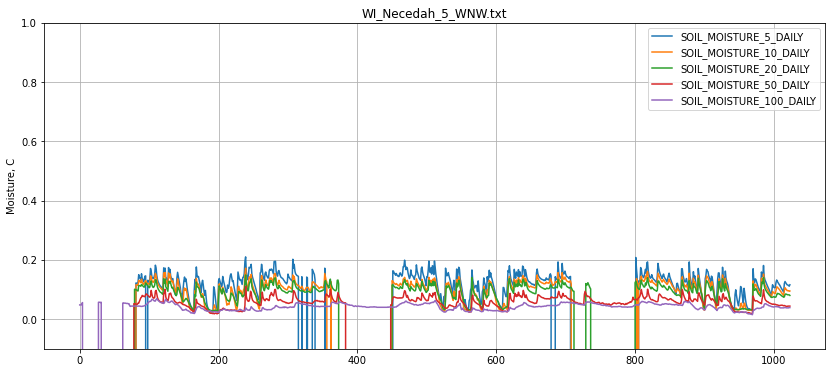

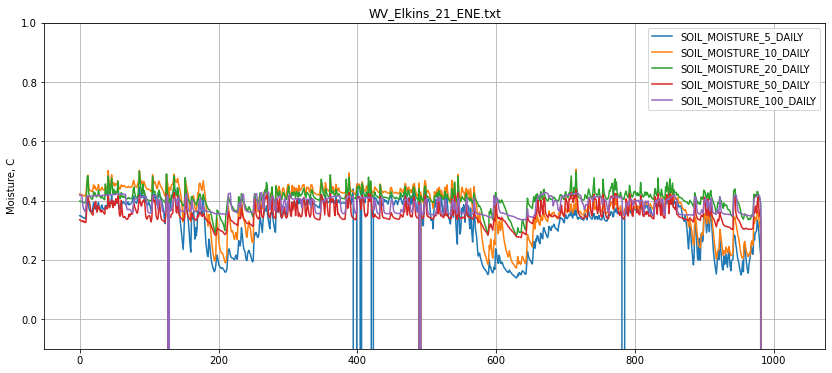

In [287]:
moist_daily=[{'id':18, 'name':'SOIL_MOISTURE_5_DAILY', 'nodata':-99}, 
             {'id':19, 'name':'SOIL_MOISTURE_10_DAILY', 'nodata':-99}, 
             {'id':20, 'name':'SOIL_MOISTURE_20_DAILY', 'nodata':-99}, 
             {'id':21, 'name':'SOIL_MOISTURE_50_DAILY', 'nodata':-99}, 
             {'id':22, 'name':'SOIL_MOISTURE_100_DAILY', 'nodata':-99}]

incorrect=get_gaps_stations(out, moist_daily, threshold=0.35)
print(incorrect)
#save_correct_stations(incorrect, 'C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/valid_stations.csv', 'C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/valid_moisture.csv')
for file in os.listdir(out):    
    if file not in incorrect:    
        df=pd.read_csv(os.path.join(out, file), sep=' ', header=None)
        SOIL_TEMP_5=df[18]
        SOIL_TEMP_10=df[19]
        SOIL_TEMP_20=df[20]
        SOIL_TEMP_50=df[21]
        SOIL_TEMP_100=df[22]
        numbers=np.arange(len(SOIL_TEMP_5))
        plt.rcParams['figure.figsize'] = [14, 6]
        fig, ax = plt.subplots()
        ax.plot(numbers, SOIL_TEMP_5, label='SOIL_MOISTURE_5_DAILY')
        ax.plot(numbers, SOIL_TEMP_10, label='SOIL_MOISTURE_10_DAILY')
        ax.plot(numbers, SOIL_TEMP_20, label='SOIL_MOISTURE_20_DAILY')
        ax.plot(numbers, SOIL_TEMP_50, label='SOIL_MOISTURE_50_DAILY')
        ax.plot(numbers, SOIL_TEMP_100, label='SOIL_MOISTURE_100_DAILY')
        ax.grid()
        ax.set(ylabel='Moisture, C',title=file)
        plt.ylim((-0.1,1))
        plt.legend()
        plt.show()

# Заполнение пропусков в данных 

## Линейная регрессия

In [128]:
from sklearn import linear_model

In [349]:
def fill_gaps(input_array, nodata, window_size=3):
    array=input_array
    x_train=[]
    y_train=[]
    for i in range(window_size, len(array)):
        go_next=False
        skip_gap=False

        while not go_next:
            sample_predictors=[]
            for j in range(window_size):
                if array[i-j-1]!=nodata:
                    sample_predictors.append(array[i-j-1])
                else:
                    go_next=True
                    skip_gap=True
                    pass

            if array[i]!=nodata and skip_gap==False:
                y_train.append(array[i])                 
                x_train.append(sample_predictors)
                while len(y_train)>window_size:
                    del y_train[0]
                    del x_train[0]
                go_next=True

            if len(x_train)>1:
                if array[i]==nodata and skip_gap==False:
                    regr = linear_model.LinearRegression()
                    regr.fit(x_train, y_train)
                    y_pred = regr.predict([sample_predictors])
                    array[i]=y_pred[0]
            else:
                go_next=True           
    return array

## Полиномиальная регрессия

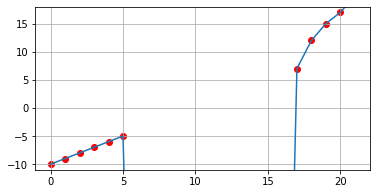

[  -9.   -8.   -7.   -6.   -5. -100. -100. -100. -100. -100. -100. -100.
 -100. -100. -100. -100.    7.   12.   15.   17.   20.]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]
[-9. -8. -7. -6. -5.  7. 12. 15. 17. 20.]
[ 1  2  3  4  5 17 18 19 20 21]


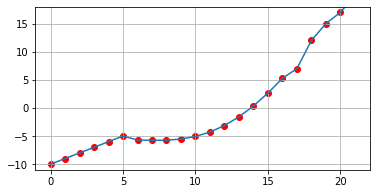

In [529]:
def fill_gaps_poly(input_array, nodata, poly_window_size=5):
    gap_indices=[]
    for i in range(len(input_array)):
        if input_array[i]==nodata:
            gap_indices.append(i)
        else:                
            if len(gap_indices)!=0:
                try:
                    subarray=input_array[gap_indices[0]-poly_window_size:gap_indices[-1]+poly_window_size+1]
                    subarray_ind=np.arange(gap_indices[0]-poly_window_size, gap_indices[-1]+poly_window_size+1)
                    print(subarray)
                    print(subarray_ind)
                    inds=np.where(subarray==nodata)
                    subarray = np.delete(subarray, inds)
                    subarray_ind = np.delete(subarray_ind, inds)
                    print(subarray)
                    print(subarray_ind)
                    z = np.polyfit(subarray_ind, subarray, 4)
                    p = np.poly1d(z)
                    for gap in gap_indices:
                        input_array[gap]=p(gap)
                except Exception as e:
                    pass                
                gap_indices=[]
    return input_array   

values=np.array([-10, -9, -8, -7, -6, -5, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, 7, 12, 15, 17, 20], dtype=np.float64)

numbers=np.arange(len(values))
plt.rcParams['figure.figsize'] = [6, 3]
fig, ax = plt.subplots()
ax.plot(numbers, values)
ax.scatter(numbers, values, color='r')
plt.ylim((-11,18))
ax.grid()
plt.show()

direct=fill_gaps_poly(values, -100)
plt.rcParams['figure.figsize'] = [6, 3]
fig, ax = plt.subplots()
ax.plot(numbers, direct)
ax.scatter(numbers, direct, color='r')
plt.ylim((-11,18))
ax.grid()
plt.show()

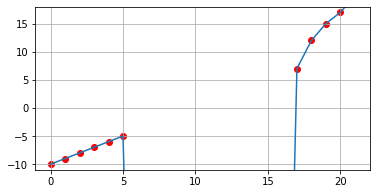

[  -9.   -8.   -7.   -6.   -5. -100. -100. -100. -100. -100. -100. -100.
 -100. -100. -100. -100.    7.   12.   15.   17.   20.]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]
[-9. -8. -7. -6. -5.  7. 12. 15. 17. 20.]
[ 1  2  3  4  5 17 18 19 20 21]


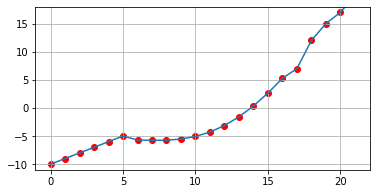

In [488]:
def fill_gaps_polynom(input_array, nodata, lin_window_size=3, poly_window_size=5):
    gap_indices=[]
    for i in range(len(input_array)):
        if input_array[i]==nodata:
            gap_indices.append(i)
        else:
            if len(gap_indices)<4 and len(gap_indices)!=0:
                print(gap_indices)
                subarray=input_array[gap_indices[0]-lin_window_size-2:gap_indices[-1]+1]
                print(subarray)
                filled_subarray=fill_gaps(subarray, nodata, window_size=lin_window_size)
                print(filled_subarray)
                input_array[gap_indices[0]-lin_window_size-2:gap_indices[-1]+1]=filled_subarray
                print(input_array)
                gap_indices=[]
    
    for i in range(len(input_array)):
        if input_array[i]==nodata:
            gap_indices.append(i)
        else:                
            if len(gap_indices)>=4 and len(gap_indices)!=0:
                try:
                    subarray=input_array[gap_indices[0]-poly_window_size:gap_indices[-1]+poly_window_size+1]
                    subarray_ind=np.arange(gap_indices[0]-poly_window_size, gap_indices[-1]+poly_window_size+1)
                    print(subarray)
                    print(subarray_ind)
                    inds=np.where(subarray==nodata)
                    subarray = np.delete(subarray, inds)
                    subarray_ind = np.delete(subarray_ind, inds)
                    print(subarray)
                    print(subarray_ind)
                    z = np.polyfit(subarray_ind, subarray, 4)
                    p = np.poly1d(z)
                    for gap in gap_indices:
                        input_array[gap]=p(gap)
                except Exception as e:
                    pass                
                gap_indices=[]
    return input_array    
    
values=np.array([-10, -9, -8, -7, -6, -5, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, 7, 12, 15, 17, 20], dtype=np.float64)

numbers=np.arange(len(values))
plt.rcParams['figure.figsize'] = [6, 3]
fig, ax = plt.subplots()
ax.plot(numbers, values)
ax.scatter(numbers, values, color='r')
plt.ylim((-11,18))
ax.grid()
plt.show()

direct=fill_gaps_polynom(values, -100)
plt.rcParams['figure.figsize'] = [6, 3]
fig, ax = plt.subplots()
ax.plot(numbers, direct)
ax.scatter(numbers, direct, color='r')
plt.ylim((-11,18))
ax.grid()
plt.show()

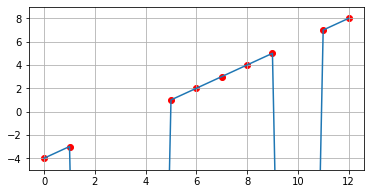

[  -4.   -3. -100. -100. -100.    1.    2.    3.    4.    5.    6.    7.
    8.]
[   8.    7.    6.    5.    4.    3.    2.    1. -100. -100. -100.   -3.
   -4.]
[ 8.0000000e+00  7.0000000e+00  6.0000000e+00  5.0000000e+00
  4.0000000e+00  3.0000000e+00  2.0000000e+00  1.0000000e+00
  4.4408921e-16 -1.0000000e+00 -2.0000000e+00 -3.0000000e+00
 -4.0000000e+00]


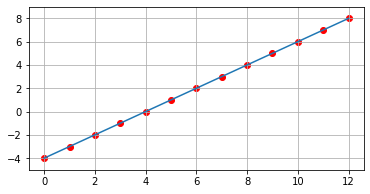

In [355]:
values=np.array([ -4, -3, -100, -100, -100, 1, 2, 3, 4, 5, -100, 7, 8], dtype=np.float64)
numbers=np.arange(len(values))

plt.rcParams['figure.figsize'] = [6, 3]
fig, ax = plt.subplots()
ax.plot(numbers, values)
ax.scatter(numbers, values, color='r')
ax.grid()
plt.ylim((-5,9))
plt.show()

direct=fill_gaps(values, -100)
print(direct)

inverse=np.flip(np.array(direct), 0)
print(inverse)

inv_no_g=fill_gaps(inverse, -100)
print(inv_no_g)

plt.rcParams['figure.figsize'] = [6, 3]
fig, ax = plt.subplots()
ax.plot(numbers, np.flip(inv_no_g, 0))
ax.scatter(numbers, np.flip(inv_no_g, 0), color='r')
plt.ylim((-5,9))
ax.grid()
plt.show()

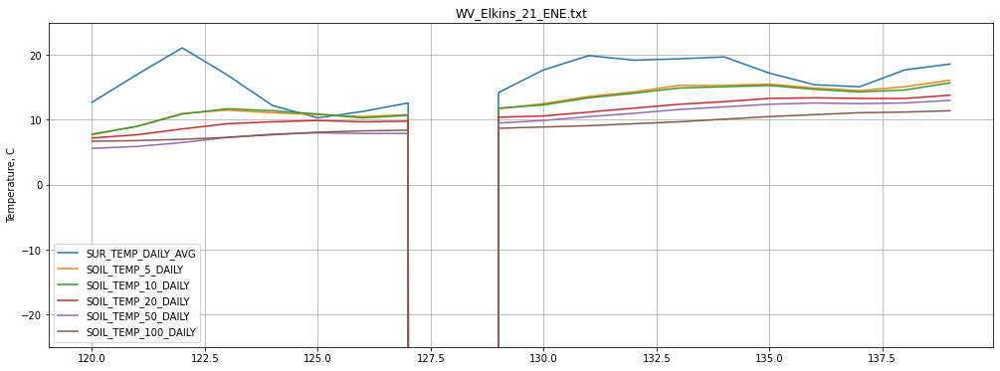

In [363]:
file_path='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/parsed_2018-2020/WV_Elkins_21_ENE.txt'
df=pd.read_csv(file_path, sep=' ', header=None)
SUR_TEMP=df[14]
SOIL_TEMP_5=df[23]
SOIL_TEMP_10=df[24]
SOIL_TEMP_20=df[25]
SOIL_TEMP_50=df[26]
SOIL_TEMP_100=df[27]
numbers=np.arange(len(SUR_TEMP))
plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers[120:140], SUR_TEMP[120:140], label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers[120:140], SOIL_TEMP_5[120:140], label='SOIL_TEMP_5_DAILY')
ax.plot(numbers[120:140], SOIL_TEMP_10[120:140], label='SOIL_TEMP_10_DAILY')
ax.plot(numbers[120:140], SOIL_TEMP_20[120:140], label='SOIL_TEMP_20_DAILY')
ax.plot(numbers[120:140], SOIL_TEMP_50[120:140], label='SOIL_TEMP_50_DAILY')
ax.plot(numbers[120:140], SOIL_TEMP_100[120:140], label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='WV_Elkins_21_ENE.txt')
plt.ylim((-25,25))
plt.legend()
plt.show()

<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See 

SUR_TEMP_2
SOIL_TEMP_5_2
SOIL_TEMP_10_2


<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See 

SOIL_TEMP_20_2
SOIL_TEMP_50_2
SOIL_TEMP_100_2


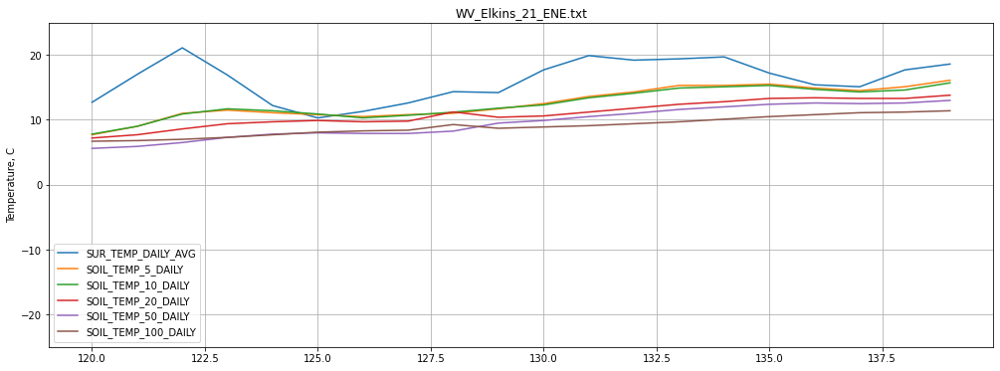

In [364]:
SUR_TEMP_2=fill_gaps(SUR_TEMP, -9999, window_size=5)
print('SUR_TEMP_2')
SOIL_TEMP_5_2=fill_gaps(SOIL_TEMP_5, -9999, window_size=5)
print('SOIL_TEMP_5_2')
SOIL_TEMP_10_2=fill_gaps(SOIL_TEMP_10, -9999, window_size=5)
print('SOIL_TEMP_10_2')
SOIL_TEMP_20_2=fill_gaps(SOIL_TEMP_20, -9999, window_size=5)
print('SOIL_TEMP_20_2')
SOIL_TEMP_50_2=fill_gaps(SOIL_TEMP_50, -9999, window_size=5)
print('SOIL_TEMP_50_2')
SOIL_TEMP_100_2=fill_gaps(SOIL_TEMP_100, -9999, window_size=5)
print('SOIL_TEMP_100_2')

plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers[120:140], SUR_TEMP_2[120:140], label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers[120:140], SOIL_TEMP_5_2[120:140], label='SOIL_TEMP_5_DAILY')
ax.plot(numbers[120:140], SOIL_TEMP_10_2[120:140], label='SOIL_TEMP_10_DAILY')
ax.plot(numbers[120:140], SOIL_TEMP_20_2[120:140], label='SOIL_TEMP_20_DAILY')
ax.plot(numbers[120:140], SOIL_TEMP_50_2[120:140], label='SOIL_TEMP_50_DAILY')
ax.plot(numbers[120:140], SOIL_TEMP_100_2[120:140], label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='WV_Elkins_21_ENE.txt')
plt.ylim((-25,25))
plt.legend()
plt.show()

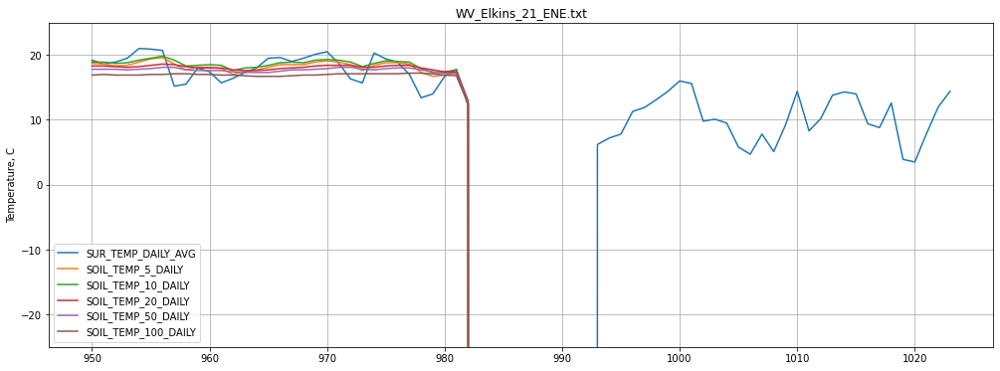

In [537]:
file_path='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/parsed_2018-2020/WV_Elkins_21_ENE.txt'
df=pd.read_csv(file_path, sep=' ', header=None)
SUR_TEMP=df[14]
SOIL_TEMP_5=df[23]
SOIL_TEMP_10=df[24]
SOIL_TEMP_20=df[25]
SOIL_TEMP_50=df[26]
SOIL_TEMP_100=df[27]
numbers=np.arange(len(SUR_TEMP))
plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers[950:], SUR_TEMP[950:], label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers[950:], SOIL_TEMP_5[950:], label='SOIL_TEMP_5_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_10[950:], label='SOIL_TEMP_10_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_20[950:], label='SOIL_TEMP_20_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_50[950:], label='SOIL_TEMP_50_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_100[950:], label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='WV_Elkins_21_ENE.txt')
plt.ylim((-25,25))
plt.legend()
plt.show()

<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See 

SUR_TEMP_2
SOIL_TEMP_5_2
SOIL_TEMP_10_2
SOIL_TEMP_20_2


<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See 

SOIL_TEMP_50_2
SOIL_TEMP_100_2


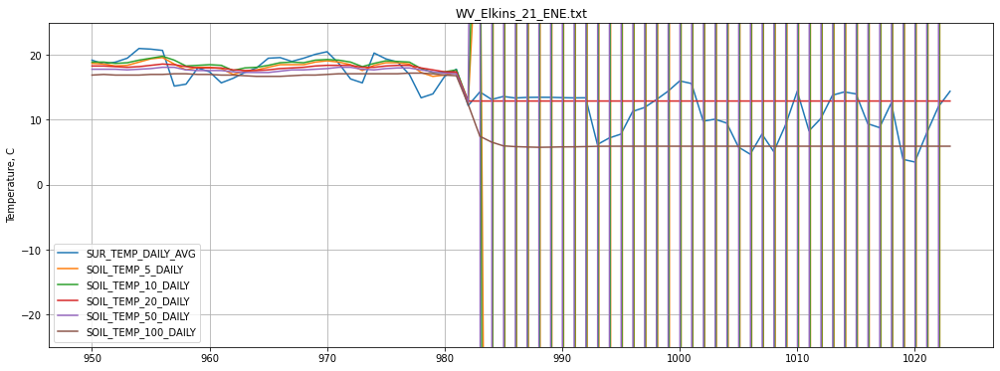

In [520]:
SUR_TEMP_2=fill_gaps(SUR_TEMP, -9999, window_size=2)
print('SUR_TEMP_2')
SOIL_TEMP_5_2=fill_gaps(SOIL_TEMP_5, -9999, window_size=2)
print('SOIL_TEMP_5_2')
SOIL_TEMP_10_2=fill_gaps(SOIL_TEMP_10, -9999, window_size=2)
print('SOIL_TEMP_10_2')
SOIL_TEMP_20_2=fill_gaps(SOIL_TEMP_20, -9999, window_size=2)
print('SOIL_TEMP_20_2')
SOIL_TEMP_50_2=fill_gaps(SOIL_TEMP_50, -9999, window_size=2)
print('SOIL_TEMP_50_2')
SOIL_TEMP_100_2=fill_gaps(SOIL_TEMP_100, -9999, window_size=2)
print('SOIL_TEMP_100_2')

plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers[950:], SUR_TEMP_2[950:], label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers[950:], SOIL_TEMP_5_2[950:], label='SOIL_TEMP_5_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_10_2[950:], label='SOIL_TEMP_10_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_20_2[950:], label='SOIL_TEMP_20_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_50_2[950:], label='SOIL_TEMP_50_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_100_2[950:], label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='WV_Elkins_21_ENE.txt')
plt.ylim((-25,25))
plt.legend()
plt.show()

[   11.5    11.1    10.8    10.5    10.8 -9999.     11.7    12.5    13.6
    14.3    15.3]
[123 124 125 126 127 128 129 130 131 132 133]
[11.5 11.1 10.8 10.5 10.8 11.7 12.5 13.6 14.3 15.3]
[123 124 125 126 127 129 130 131 132 133]
[   12.4    12.8    13.3    13.1    13.  -9999.     12.9    13.5    14.3
    14.2    13.8]
[485 486 487 488 489 490 491 492 493 494 495]
[12.4 12.8 13.3 13.1 13.  12.9 13.5 14.3 14.2 13.8]
[485 486 487 488 489 491 492 493 494 495]
[   11.7    11.4    10.9    10.3    10.7 -9999.     11.8    12.3    13.4
    14.1    14.9]
[123 124 125 126 127 128 129 130 131 132 133]
[11.7 11.4 10.9 10.3 10.7 11.8 12.3 13.4 14.1 14.9]
[123 124 125 126 127 129 130 131 132 133]
[   12.2    12.7    13.1    13.     13.  -9999.     12.7    13.3    14.1
    14.2    13.8]
[485 486 487 488 489 490 491 492 493 494 495]
[12.2 12.7 13.1 13.  13.  12.7 13.3 14.1 14.2 13.8]
[485 486 487 488 489 491 492 493 494 495]
[ 9.400e+00  9.700e+00  9.900e+00  9.700e+00  9.800e+00 -9.999e+03
  1.040e+

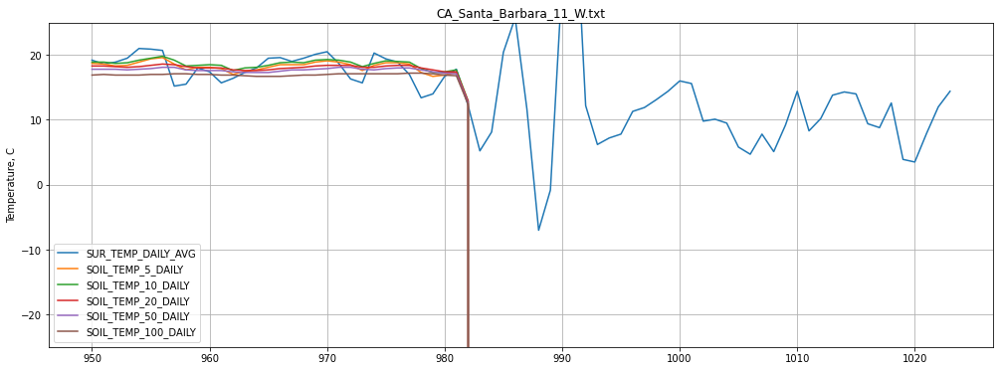

In [538]:
SUR_TEMP_3=fill_gaps(SUR_TEMP.to_numpy(), -9999, window_size=5)

SOIL_TEMP_5_3=fill_gaps_poly(SOIL_TEMP_5.to_numpy(), -9999, poly_window_size=5)

SOIL_TEMP_10_3=fill_gaps_poly(SOIL_TEMP_10.to_numpy(), -9999, poly_window_size=5)

SOIL_TEMP_20_3=fill_gaps_poly(SOIL_TEMP_20.to_numpy(), -9999, poly_window_size=5)

SOIL_TEMP_50_3=fill_gaps_poly(SOIL_TEMP_50.to_numpy(), -9999, poly_window_size=5)

SOIL_TEMP_100_3=fill_gaps_poly(SOIL_TEMP_100.to_numpy(), -9999, poly_window_size=5)

plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers[950:], SUR_TEMP_3[950:], label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers[950:], SOIL_TEMP_5_3[950:], label='SOIL_TEMP_5_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_10_3[950:], label='SOIL_TEMP_10_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_20_3[950:], label='SOIL_TEMP_20_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_50_3[950:], label='SOIL_TEMP_50_DAILY')
ax.plot(numbers[950:], SOIL_TEMP_100_3[950:], label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='CA_Santa_Barbara_11_W.txt')
plt.ylim((-25,25))
plt.legend()
plt.show()

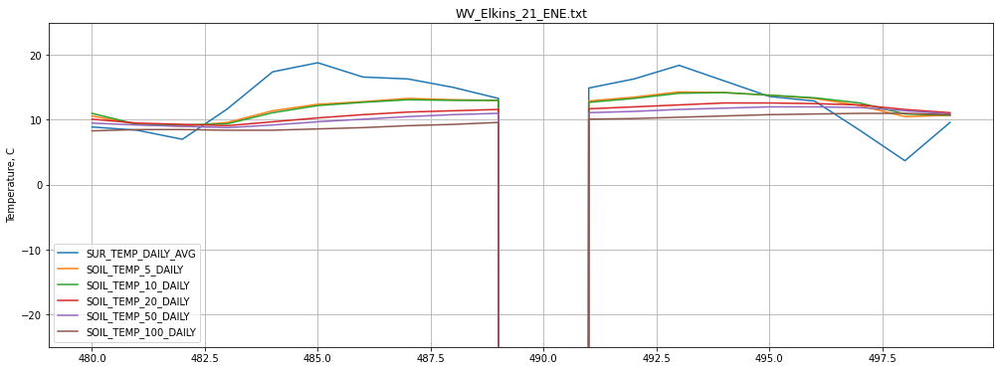

In [368]:
file_path='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/parsed_2018-2020/WV_Elkins_21_ENE.txt'
df=pd.read_csv(file_path, sep=' ', header=None)
SUR_TEMP=df[14]
SOIL_TEMP_5=df[23]
SOIL_TEMP_10=df[24]
SOIL_TEMP_20=df[25]
SOIL_TEMP_50=df[26]
SOIL_TEMP_100=df[27]
numbers=np.arange(len(SUR_TEMP))
plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers[480:500], SUR_TEMP[480:500], label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers[480:500], SOIL_TEMP_5[480:500], label='SOIL_TEMP_5_DAILY')
ax.plot(numbers[480:500], SOIL_TEMP_10[480:500], label='SOIL_TEMP_10_DAILY')
ax.plot(numbers[480:500], SOIL_TEMP_20[480:500], label='SOIL_TEMP_20_DAILY')
ax.plot(numbers[480:500], SOIL_TEMP_50[480:500], label='SOIL_TEMP_50_DAILY')
ax.plot(numbers[480:500], SOIL_TEMP_100[480:500], label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='WV_Elkins_21_ENE.txt')
plt.ylim((-25,25))
plt.legend()
plt.show()

<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See 

SUR_TEMP_2
SOIL_TEMP_5_2
SOIL_TEMP_10_2


<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See 

SOIL_TEMP_20_2
SOIL_TEMP_50_2
SOIL_TEMP_100_2


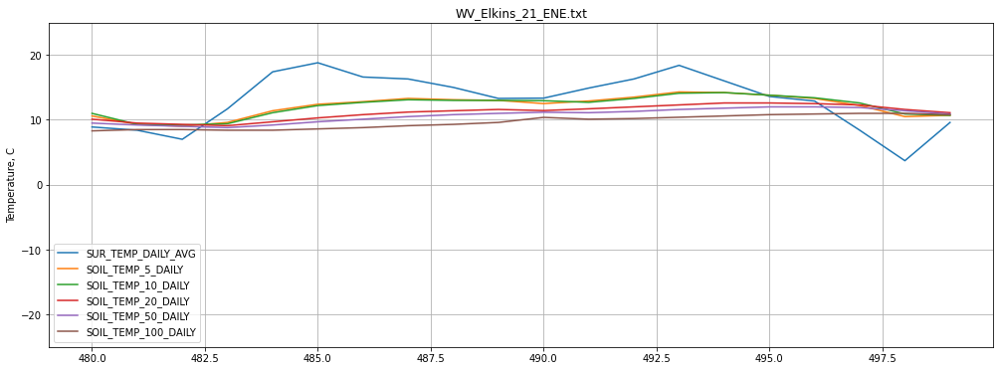

In [369]:
SUR_TEMP_2=fill_gaps(SUR_TEMP, -9999, window_size=5)
print('SUR_TEMP_2')
SOIL_TEMP_5_2=fill_gaps(SOIL_TEMP_5, -9999, window_size=5)
print('SOIL_TEMP_5_2')
SOIL_TEMP_10_2=fill_gaps(SOIL_TEMP_10, -9999, window_size=5)
print('SOIL_TEMP_10_2')
SOIL_TEMP_20_2=fill_gaps(SOIL_TEMP_20, -9999, window_size=5)
print('SOIL_TEMP_20_2')
SOIL_TEMP_50_2=fill_gaps(SOIL_TEMP_50, -9999, window_size=5)
print('SOIL_TEMP_50_2')
SOIL_TEMP_100_2=fill_gaps(SOIL_TEMP_100, -9999, window_size=5)
print('SOIL_TEMP_100_2')

plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers[480:500], SUR_TEMP_2[480:500], label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers[480:500], SOIL_TEMP_5_2[480:500], label='SOIL_TEMP_5_DAILY')
ax.plot(numbers[480:500], SOIL_TEMP_10_2[480:500], label='SOIL_TEMP_10_DAILY')
ax.plot(numbers[480:500], SOIL_TEMP_20_2[480:500], label='SOIL_TEMP_20_DAILY')
ax.plot(numbers[480:500], SOIL_TEMP_50_2[480:500], label='SOIL_TEMP_50_DAILY')
ax.plot(numbers[480:500], SOIL_TEMP_100_2[480:500], label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='WV_Elkins_21_ENE.txt')
plt.ylim((-25,25))
plt.legend()
plt.show()

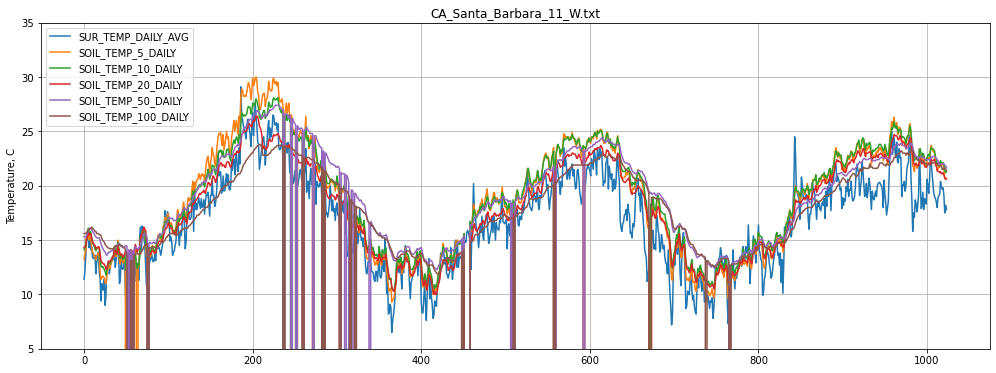

In [535]:
file_path='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_data_preparation/parsed_2018-2020/CA_Santa_Barbara_11_W.txt'
df=pd.read_csv(file_path, sep=' ', header=None)
SUR_TEMP=df[14]
SOIL_TEMP_5=df[23]
SOIL_TEMP_10=df[24]
SOIL_TEMP_20=df[25]
SOIL_TEMP_50=df[26]
SOIL_TEMP_100=df[27]
numbers=np.arange(len(SUR_TEMP))

plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers, SUR_TEMP, label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers, SOIL_TEMP_5, label='SOIL_TEMP_5_DAILY')
ax.plot(numbers, SOIL_TEMP_10, label='SOIL_TEMP_10_DAILY')
ax.plot(numbers, SOIL_TEMP_20, label='SOIL_TEMP_20_DAILY')
ax.plot(numbers, SOIL_TEMP_50, label='SOIL_TEMP_50_DAILY')
ax.plot(numbers, SOIL_TEMP_100, label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='CA_Santa_Barbara_11_W.txt')
plt.ylim((5,35))
plt.legend()
plt.show()

<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See 

SUR_TEMP_2
SOIL_TEMP_5_2
SOIL_TEMP_10_2
SOIL_TEMP_20_2
SOIL_TEMP_50_2


<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]
<ipython-input-349-296dd2d2baa7>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  array[i]=y_pred[0]


SOIL_TEMP_100_2


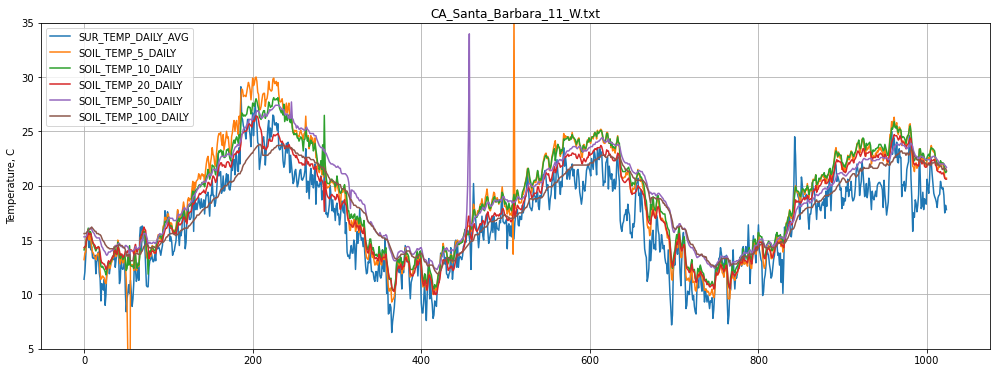

In [531]:
SUR_TEMP_2=fill_gaps(SUR_TEMP, -9999, window_size=2)
print('SUR_TEMP_2')
SOIL_TEMP_5_2=fill_gaps(SOIL_TEMP_5, -9999, window_size=2)
print('SOIL_TEMP_5_2')
SOIL_TEMP_10_2=fill_gaps(SOIL_TEMP_10, -9999, window_size=2)
print('SOIL_TEMP_10_2')
SOIL_TEMP_20_2=fill_gaps(SOIL_TEMP_20, -9999, window_size=2)
print('SOIL_TEMP_20_2')
SOIL_TEMP_50_2=fill_gaps(SOIL_TEMP_50, -9999, window_size=2)
print('SOIL_TEMP_50_2')
SOIL_TEMP_100_2=fill_gaps(SOIL_TEMP_100, -9999, window_size=2)
print('SOIL_TEMP_100_2')

plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers, SUR_TEMP_2, label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers, SOIL_TEMP_5_2, label='SOIL_TEMP_5_DAILY')
ax.plot(numbers, SOIL_TEMP_10_2, label='SOIL_TEMP_10_DAILY')
ax.plot(numbers, SOIL_TEMP_20_2, label='SOIL_TEMP_20_DAILY')
ax.plot(numbers, SOIL_TEMP_50_2, label='SOIL_TEMP_50_DAILY')
ax.plot(numbers, SOIL_TEMP_100_2, label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='CA_Santa_Barbara_11_W.txt')
plt.ylim((5,35))
plt.legend()
plt.show()

[   13.2    12.9    13.1    13.5    12.8 -9999.  -9999.  -9999.  -9999.
 -9999.     12.8    12.7 -9999.  -9999.     12.2]
[45 46 47 48 49 50 51 52 53 54 55 56 57 58 59]
[13.2 12.9 13.1 13.5 12.8 12.8 12.7 12.2]
[45 46 47 48 49 55 56 59]
[   12.92063534    12.8796079     12.83573355    12.8
    12.7        -9999.         -9999.            12.2
    14.3           13.7           12.2        -9999.        ]
[52 53 54 55 56 57 58 59 60 61 62 63]
[12.92063534 12.8796079  12.83573355 12.8        12.7        12.2
 14.3        13.7        12.2       ]
[52 53 54 55 56 59 60 61 62]
[   12.66428487    12.2           14.3           13.7
    12.2        -9999.            12.8           12.6
    13.9           15.3           14.8       ]
[58 59 60 61 62 63 64 65 66 67 68]
[12.66428487 12.2        14.3        13.7        12.2        12.8
 12.6        13.9        15.3        14.8       ]
[58 59 60 61 62 64 65 66 67 68]
[   15.9    15.7    14.8    13.5    13.3 -9999.     13.4    13.9    13.5
    14.2   

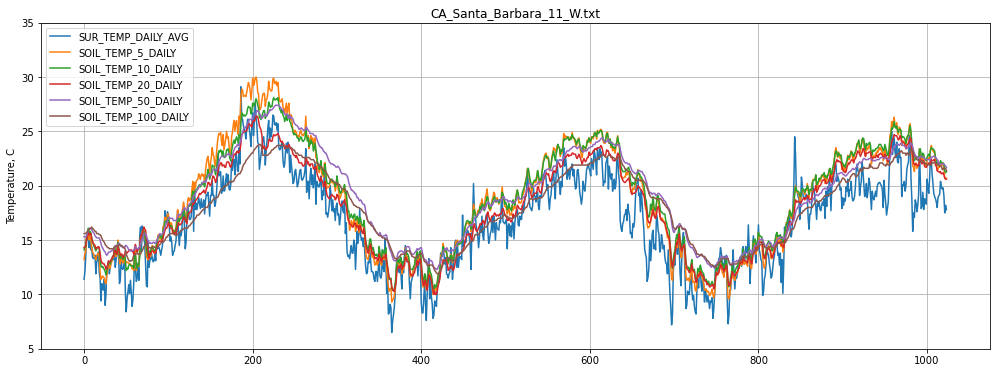

In [536]:
SUR_TEMP_3=fill_gaps(SUR_TEMP.to_numpy(), -9999, window_size=5)

SOIL_TEMP_5_3=fill_gaps_poly(SOIL_TEMP_5.to_numpy(), -9999, poly_window_size=5)

SOIL_TEMP_10_3=fill_gaps_poly(SOIL_TEMP_10.to_numpy(), -9999, poly_window_size=5)

SOIL_TEMP_20_3=fill_gaps_poly(SOIL_TEMP_20.to_numpy(), -9999, poly_window_size=5)

SOIL_TEMP_50_3=fill_gaps_poly(SOIL_TEMP_50.to_numpy(), -9999, poly_window_size=5)

SOIL_TEMP_100_3=fill_gaps_poly(SOIL_TEMP_100.to_numpy(), -9999, poly_window_size=5)

plt.rcParams['figure.figsize'] = [17, 6]
fig, ax = plt.subplots()
ax.plot(numbers, SUR_TEMP_3, label='SUR_TEMP_DAILY_AVG')
ax.plot(numbers, SOIL_TEMP_5_3, label='SOIL_TEMP_5_DAILY')
ax.plot(numbers, SOIL_TEMP_10_3, label='SOIL_TEMP_10_DAILY')
ax.plot(numbers, SOIL_TEMP_20_3, label='SOIL_TEMP_20_DAILY')
ax.plot(numbers, SOIL_TEMP_50_3, label='SOIL_TEMP_50_DAILY')
ax.plot(numbers, SOIL_TEMP_100_3, label='SOIL_TEMP_100_DAILY')
ax.grid()
ax.set(ylabel='Temperature, C',title='CA_Santa_Barbara_11_W.txt')
plt.ylim((5,35))
plt.legend()
plt.show()